In [1]:
import os
import sys

import multiprocess as mp

import mirnylib.plotting
import cooler
import cooltools
from cooltools import insulation, snipping
import bioframe
from sklearn.mixture import GaussianMixture
from mirnylib.numutils import zoomArray

import DNA_info
import matrix_manager as mm
import cooltools_pileups
%matplotlib notebook

In [ ]:
# db = mm.Dataset()
# table = db.get_tables(['tads', 'scaling_metrics']).dropna()
# table = mm.filter_data(table, filter_dict={'cycle':['NS']})
# fig, ax = plt.subplots(ncols=3, sharex=True, sharey=True, figsize= (10, 3), constrained_layout=True)

# x_col = 'avg_slope_100kb'
# # x_col = 'avg_slope_4Mb'
# # x_col = 'avg_slope_127Mb'
# if x_col == 'avg_slope_100kb':
#     xlabel = 'Average Scaling Slope 0-100kb'
# elif x_col == 'avg_slope_4Mb':
#     xlabel = 'Average Scaling Slope 100kb-4Mb'
# else:
#     xlabel = 'Average Scaling Slope 4Mb-127Mb'
    
# for ind, cat in enumerate(['celltype', 'enzyme', 'xlink']):
#     ax[ind].set_ylabel('TAD Strength', fontweight='bold')
#     ax[ind].set_xlabel(xlabel, fontweight='bold')
#     colors = get_custom_cmap(len(table.celltype.unique()))
#     i = 0
#     for ct, group in table.groupby(cat):
#         x = group[x_col].values
#         y = group['tad_strength'].values
#         ax[ind].scatter(x, y, c=colors[i], label=ct)
#         i += 1

#     ax[ind].legend()
# fig.savefig('/home/sameer/Dropbox (MIT)/Research/U54_matrix/TADs/raoTads/scaling_scatter.png')

In [3]:
def link_adjacent_sites(df):
    assert np.all([x in df.columns for x in ['chrom', 'start', 'end']])
    df = df.dropna()
    
    l_df = df.iloc[0:-1].copy().reset_index(drop=True)
    l_df.columns = [x+'1' for x in l_df.columns]
    r_df = df.iloc[1:].copy().reset_index(drop=True)
    r_df.columns = [x+'2' for x in r_df.columns]

    df2 = pd.concat([l_df, r_df], axis=1)
    df2 = df2[df2.chrom1==df2.chrom2]
    
    return df2

INFO:numexpr.utils:Note: NumExpr detected 40 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.


<IPython.core.display.Javascript object>


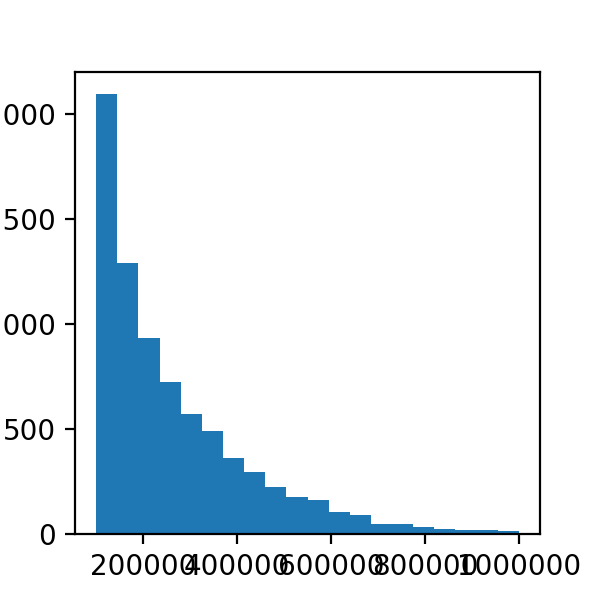

In [4]:
rao_path = './GSE63525_GM12878_primary+replicate_Arrowhead_domainlist_hg38.txt'
rao_tads = pd.read_csv(rao_path, sep='\t')
rao_tads['size'] = rao_tads['end1'] - rao_tads['start1']
rao_tads = rao_tads[(rao_tads['size'] > 10**5) & (rao_tads['size'] <= 10**6)]
plt.figure(figsize=(3,3))
_ = plt.hist(rao_tads['size'].values, bins=20)

In [ ]:
df = insul.dropna()
df = df[df.peak_cat == 'false_peak']
df2 = link_adjacent_sites(df)
df2['size'] = df2['start2'] - df2['start1']
df2 = df2[(df2['size'] > 10**5) & (df2['size'] <= 10**6)]
plt.figure(figsize=(3,3))
# plt.xscale('log')
plt.yscale('log')
_ = plt.hist((df2['start2'] - df2['start1']).values, bins=20) 

In [8]:
db = mm.Dataset()
table = db.get_tables()
insulations = mm.filter_data(table, filter_dict={'seq':'deep'})
insulations = mm.get_insulation(insulations, res=10000)
table = mm.get_coolers(table, res=10000)
arms = DNA_info.get_chromosome_arms('hg38')
basepath = './pileups/tads/'

for _, row in insulations.iterrows():
    print(row['lib_name'])
    lib_name = row['lib_name']
    insul = row['insulation_10000']
    insul = insul.rename(columns={'log2_insulation_score_100000':'insul_score',
                                  'boundary_strength_100000':'strength'})
    insul = insul[['chrom','start','end','insul_score','strength','category']].dropna()
    
    for cat in ['all', 'strong','weak']:
        ins = insul.copy()
        if cat is not 'all':
            ins = ins[ins.category == cat]
        insul_tads = link_adjacent_sites(ins)
        insul_tads['pos'] = (insul_tads['start1'] + insul_tads['start2'])//2
        
        binned_list = snipping.make_bin_aligned_windows(10000, insul_tads['chrom1'].values, 
                                               insul_tads['pos'].values, flank_bp=1000000)
        features = snipping.assign_regions(binned_list, arms)
        assert np.all(features['region'].apply(lambda x: isinstance(x, str)))
        
        savepath = f'{basepath}{lib_name}/{cat}/10000/'
        os.makedirs(savepath, exist_ok=True)
        df = insul_tads[['chrom1','start1','start2','pos','strength1','strength2']]
        df = df.rename(columns={'chrom1':'chrom','start1':'start','start2':'end',
                                'strength1':'start_strength', 'strength2':'end_strength'})
        assert len(df) == len(features)
        df.to_csv(f'{savepath}/tadlist.txt', sep='\t', header=True, index=False)

        for _, row2 in table.iterrows():
            name = row2['lib_name']
            print(name)

            cool = row2[f'cooler_{10000}']

            snipper = cooltools_pileups.LocalObsExpSnipper(cool, cooler_opts={'balance':True})
            with mp.Pool(20) as p:
                pileup = snipping.pileup(features, snipper.select, snipper.snip, map=p.map)
 
            np.save(f'{savepath}/{name}.npy', pileup)
            print(f'Saved to: {savepath}/{name}.npy')
        
    

U54-END-FA-DpnII-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 0, 44955504) ('chr8', 0, 44955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 13839

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 44454096, 13

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 9221

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 605

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 14513

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 4495

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 1451

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 449

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr8', 0, 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-END4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527517

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527517

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr10', 40640101, 133797422) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 40640101, 133797422

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 40640101, 133797422) ('chr10', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 406401

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11', 0, 527517

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 40640101, 133

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 40640101, 133797422) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 406

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275171

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 40640101,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 1337

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527517

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 13379742

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 13379742

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11', 0, 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 13379742

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 4064

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 4064010

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr11', 52

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 527

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11', 0, 5275

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr11', 0, 52751711) ('chr11', 0, 52751

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr10', 40640101, 13

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-ESC-FA-DpnII-R1-R2-R3/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 4495

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 13

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 449

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 40640101, 133797422) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-H1ESC4DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 14

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 14

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr10', 0, 40640101) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 14

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DdeI-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 13

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr10', 0, 406

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 14513

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr10', 0, 40640

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr10', 0, 40640101) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 1451

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-DSG-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr10', 0, 4064010

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717) ('chr9', 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 449

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 1451

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 9221401

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 13839471

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr8', 44955504, 145138636) ('chr8', 4495

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc6-FA-DpnII-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 4495

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 4495

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 0, 40640101) ('chr10', 0, 40640101)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_di

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), n

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 1451

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 14513

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 5081

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 138394717) ('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451386

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 449555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 444540

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 444

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 44454096, 13839471

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr9', 44454096, 138394717

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 4445409

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)
Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 4495550

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 4445

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr9', 0, 44454096) ('chr9', 0, 44454

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 14513863

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)
('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
('chrY', 0, 10430491) ('chrY', 0, 10430491)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')


('chrY', 10430491, 57227415) ('chrY', 10430491, 57227415)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


Saved to: ./pileups/tads/U54-HFFc64DN-FA-DSG-MNase-R1-R2/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
HelaS3
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr10', 0, 40640101) ('chr10', 0, 40640101)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr8', 44955504, 145138636) ('chr8', 44955504, 145138636)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 922

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr6', 59191911, 170805979) ('chr6

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 5072800

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 50728006, 190214555) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 5072800

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1902145

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1902145

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1902145

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr3', 0, 922140

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 9313935

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 0, 92214016) ('chr3', 0, 92

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 5

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 19829

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/all/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 922

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 931393

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 507

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 4827285

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 5072800

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 24895642

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr8', 0, 44955504) ('chr8', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 1902145

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 5072

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1902

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 48272853, 181538

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 922140

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 17080597

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 2489564

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 9221401

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/HelaS3/strong/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr9', 44454096, 138394717) ('chr9', 44454096, 138394717)
('chr10', 40640101

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('ch

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  ma

('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 1902

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 9313935

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr10', 40640101, 133797422) ('chr10', 40640101, 133797422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 9221401

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 24219352

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 24219352

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/strong/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy
U54-END-DSG-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 1982955

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-DSG-DdeI-20161031-R1-T1__hg38.npy
U54-END-EGS-DdeI-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-EGS-DdeI-20161219-R1-T1__hg38.npy
U54-END-FA-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-FA-DdeI-20161118-R1-T1__hg38.npy
U54-END-DSG-DpnII-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-DSG-DpnII-20190711-R2-T1__hg38.npy
U54-END-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-FA-DpnII-20170119-R2-T1__hg38.npy
U54-END-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-FA-DpnII-R1-R2.npy
U54-END-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-END-EGS-HindIII-20161219-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-EGS-HindIII-20161219-R1-T1__hg38.npy
U54-END-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-FA-HindIII-20160311-R1-T1__hg38.npy
U54-END-DSG-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-DSG-MNase-20170508-R1-T1__hg38.npy
U54-END4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19021455

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END4DN-FA-DSG-MNase-R1-R2.npy
U54-END-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-EGS-MNase-20170508-R1-T1__hg38.npy
U54-END-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-END-FA-MNase-20170508-R1-T1__hg38.npy
U54-ESC-DSG-DdeI-20161014-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 5072

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-DSG-DdeI-20161014-R1-T1__hg38.npy
U54-ESC-EGS-DdeI-20161118-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 1

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-EGS-DdeI-20161118-R1-T1__hg38.npy
U54-ESC-FA-DdeI-20190711-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-FA-DdeI-20190711-R2-T1__hg38.npy
U54-ESC-DSG-DpnII-20160722-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 9221

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-DSG-DpnII-20160722-R1-T1__hg38.npy
U54-ESC-EGS-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-EGS-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expe

('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-FA-DpnII-20170119-R2-T1__hg38.npy
U54-ESC-FA-DpnII-R1-R2-R3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-FA-DpnII-R1-R2-R3.npy
U54-ESC-DSG-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-DSG-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-EGS-HindIII-20161206-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-EGS-HindIII-20161206-R1-T1__hg38.npy
U54-ESC-FA-HindIII-20160311-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 507280

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-FA-HindIII-20160311-R1-T1__hg38.npy
U54-ESC-DSG-MNase-20170508-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('chr5', 0, 48272853)
('chr5', 48272853, 181538259) ('chr5', 48272853, 181538259)
('chr6', 0, 59191911) ('chr6', 0, 59191911)
('chr6', 59191911, 170805979) ('chr6', 59191911, 170805979)
('chr7', 0, 59848836) ('chr7', 0, 59848836)
('chr7', 59848836, 159345973) ('chr7', 59848836, 159345973)
('chr8', 0, 44955504) ('chr8', 0, 44955504)
('chr9', 0, 44454096) ('chr9', 0, 44454096)
('chr8', 44955504, 145138636) ('chr8', 44955504, 1451

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-DSG-MNase-20170508-R2-T1__hg38.npy
U54-H1ESC4DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-H1ESC4DN-FA-DSG-MNase-R1-R2.npy
U54-ESC-EGS-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-EGS-MNase-20170508-R1-T1__hg38.npy
U54-ESC-FA-MNase-20170508-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) (

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-ESC-FA-MNase-20170508-R1-T1__hg38.npy
U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-DSG-DdeI-20160812-R1-T1__hg38.npy
U54-HFFc6-DSG-DdeI-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19021455

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFFc6-DSG-DdeI-R1-R2.npy
U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-EGS-DdeI-20161031-R1-T1__hg38.npy
U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-FA-DdeI-20170119-R2-T1__hg38.npy
U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4',

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-DSG-DpnII-20170119-R2-T1__hg38.npy
U54-HFFc6-DSG-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFFc6-DSG-DpnII-R1-R2.npy
U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-EGS-DpnII-20160902-R1-T1__hg38.npy
U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-FA-DpnII-20180904-R1-T1__hg38.npy
U54-HFFc6-FA-DpnII-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 19021455

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFFc6-FA-DpnII-R1-R2.npy
U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr5', 0, 48272853) ('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-DSG-HindIII-20160226-R1-T1__hg38.npy
U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-EGS-HindIII-20190718-R2-T1__hg38.npy
U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-FA-HindIIII-20160226-R2-T1__hg38.npy
U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38.npy
U54-HFFc64DN-FA-DSG-MNase-R1-R2
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFFc64DN-FA-DSG-MNase-R1-R2.npy
U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38.npy
U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38.npy
U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HFFc6-DSG-DdeI-DpnII-20190711-R1-T1__hg38.npy
HelaS3
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//HelaS3.npy
U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 50728006, 190214555) ('chr4', 50728

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-DSG-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr11', 0, 52751711) ('chr11', 0, 52751711)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-EGS-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('c

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-FA-DpnII-20180709-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 922140

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-DSG-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-EGS-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 50728006, 190214555) ('chr4', 50728006, 190214555)
('chr6', 0, 59191911) ('chr6', 0,

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr2', 93139351

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)
('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38.npy
U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
(

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-DSG-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-EGS-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4'

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 0, 52751711) ('chr11', 0, 52751711)
('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)
('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:78: RuntimeWarning: divide by zero encountered in log10
  f = interp1d(np.log10(bin_mids), np.log10(coarse_expected), kind='linear')
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:83: RuntimeWarning: invalid value encountered in double_scalars
  yremaining = y[-1] + ((y[-1]-y[-2])/(x[-1]-x[-2]))*(xremaining - x[-1])
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: divide by zero encountered in true_divide
  matrix.data = data/fine_expected[diff]
/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:99: RuntimeWarning: invalid value encountered in true_divide
  matrix.data = data/fine_expected[diff]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38.npy
U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38
('chr1', 0, 123479591) ('chr1', 0, 123479591)
('chr1', 123479591, 248956422) ('chr1', 123479591, 248956422)
('chr2', 0, 93139351) ('chr2', 0, 93139351)
('chr2', 93139351, 242193529) ('chr2', 93139351, 242193529)
('chr3', 92214016, 198295559) ('chr3', 92214016, 198295559)
('chr3', 0, 92214016) ('chr3', 0, 92214016)
('chr4', 0, 50728006) ('chr4', 0, 50728006)
('chr4', 

/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr11', 52751711, 135086622) ('chr11', 52751711, 135086622)
('chr12', 0, 35977329) ('chr12', 0, 35977329)
('chr12', 35977329, 133275309) ('chr12', 35977329, 133275309)
('chr13', 17025624, 114364328) ('chr13', 17025624, 114364328)
('chr14', 17086761, 107043718) ('chr14', 17086761, 107043718)
('chr15', 18404463, 101991189) ('chr15', 18404463, 101991189)
('chr16', 0, 37288413) ('chr16', 0, 37288413)
('chr16', 37288413, 90338345) ('chr16', 37288413, 90338345)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr17', 0, 24714921) ('chr17', 0, 24714921)
('chr17', 24714921, 83257441) ('chr17', 24714921, 83257441)
('chr18', 0, 18161052) ('chr18', 0, 18161052)


/net/levsha/share/sameer/github/mirnylab-experimental/sameer/pileups/cooltools_pileups.py:76: RuntimeWarning: invalid value encountered in true_divide
  coarse_expected = log_scaling[1:]/log_count[1:]


('chr18', 18161052, 80373285) ('chr18', 18161052, 80373285)
('chr19', 0, 25844927) ('chr19', 0, 25844927)
('chr19', 25844927, 58617616) ('chr19', 25844927, 58617616)
('chr20', 0, 28237290) ('chr20', 0, 28237290)
('chr20', 28237290, 64444167) ('chr20', 28237290, 64444167)
('chr21', 11890184, 46709983) ('chr21', 11890184, 46709983)
('chr22', 14004553, 50818468) ('chr22', 14004553, 50818468)
('chrX', 0, 60509060) ('chrX', 0, 60509060)
('chrX', 60509060, 156040895) ('chrX', 60509060, 156040895)
Saved to: ./pileups/tads/HelaS3/weak/10000//U54-HelaS3-NS-FA-MNase-08072018-R1-T1__hg38.npy


# Pileups:

In [ ]:
rao_path = './GSE63525_GM12878_primary+replicate_Arrowhead_domainlist_hg38.txt'
rao_tads = pd.read_csv(rao_path, sep='\t')
rao_tads['size'] = rao_tads['end1'] - rao_tads['start1']
# tads = tads.loc[(tads['size'].values > 10**5) & (tads['size'].values < 10**6)].reset_index(drop=True)
# tads.to_csv('./pileups/tads/rao2014/GSE63525_GM12878_primary+replicate_Arrowhead_domainlist_hg38.txt',
#             sep='\t', header=True, index=False)

plt.figure()
_ = plt.hist(tads['size'].values, bins=100)

In [ ]:
resolution = 10000
arms = DNA_info.get_chromosome_arms('hg38')
data = mm.Dataset()
table = data.get_tables()
# table = mm.filter_data(table, filter_dict={'enzyme':'double'})
table = mm.get_coolers(table, res=resolution)
table

In [ ]:
binned_list = snipping.make_bin_aligned_windows(resolution, tads['chrom1'].values, 
                                               tads['pos'].values, flank_bp=1000000)
features = snipping.assign_regions(binned_list, arms)
assert np.all(features['region'].apply(lambda x: isinstance(x, str)))
features

In [ ]:
for _, row in table.iterrows():
    name = row['lib_name']
    print(name)
     
    cool = row[f'cooler_{resolution}']

    snipper = cooltools_pileups.LocalObsExpSnipper(cool, cooler_opts={'balance':True})
    with mp.Pool(20) as p:
        pileup = snipping.pileup(features, snipper.select, snipper.snip, map=p.map)

    savepath = f'./pileups/tads/rao2014/{resolution}'
    os.makedirs(savepath, exist_ok=True)
    savepath = f'{savepath}/{name}.npy'
    np.save(savepath, pileup)
    print(f'Saved to: {savepath}')

# Visualizing

<IPython.core.display.Javascript object>


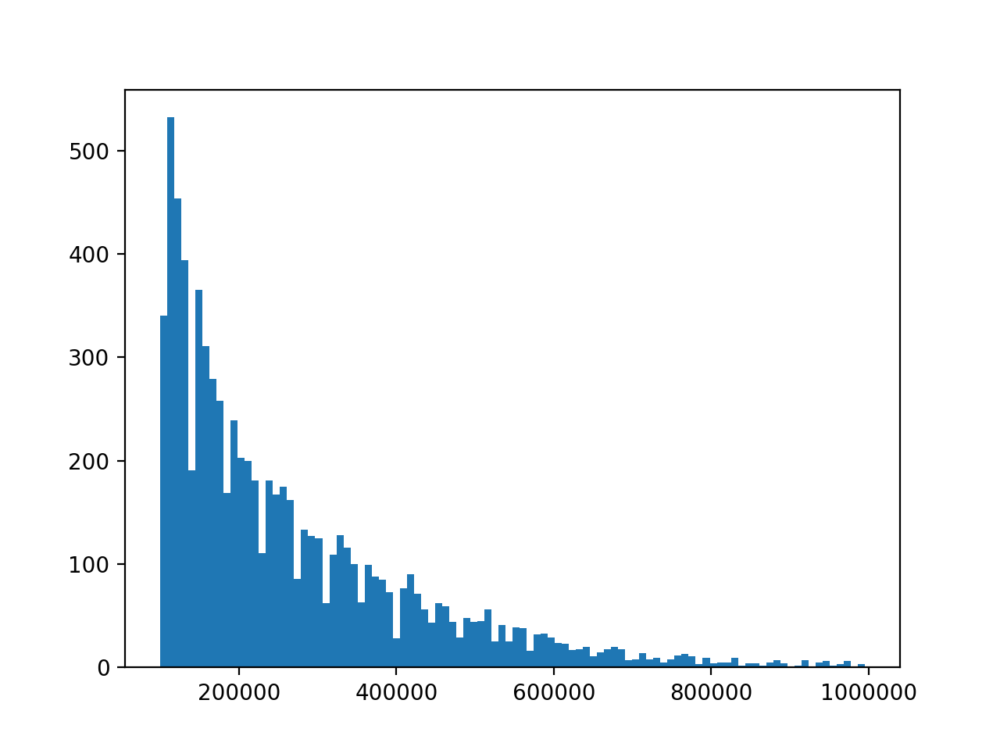

In [2]:
tad_path = '/net/levsha/share/sameer/U54/hic_matrix/'
tads = pd.read_csv(tad_path+'/pileups/tads/rao2014/GSE63525_GM12878_primary+replicate_Arrowhead_domainlist_hg38.txt',
            sep='\t')
plt.figure()
_ = plt.hist(tads['size'].values, bins=100)

In [4]:
imp.reload(mm)
db = mm.Dataset()
table = db.get_tables()
table = mm.get_tads(table, 'rao2014', 10000)
pu = table.loc[28, 'tads_10000'].load()
table

,lib_name,seq,celltype,xlink,enzyme,cycle,tads_10000
0,U54-END-DSG-DdeI-20161031-R1-T1__hg38,-,END,DSG,DdeI,NS,<matrix_manager.Pileup object at 0x7f8343adcb70>
1,U54-END-DSG-DpnII-20190711-R2-T1__hg38,-,END,DSG,DpnII,NS,<matrix_manager.Pileup object at 0x7f8343adc860>
2,U54-END-DSG-HindIII-20161206-R1-T1__hg38,-,END,DSG,HindIII,NS,<matrix_manager.Pileup object at 0x7f8343adc780>
3,U54-END-DSG-MNase-20170508-R1-T1__hg38,control,END,DSG,MNase,NS,<matrix_manager.Pileup object at 0x7f8343adcc18>
4,U54-END4DN-FA-DSG-MNase-R1-R2_hg38,deep,END,DSG,MNase,NS,<matrix_manager.Pileup object at 0x7f8343adc7b8>
...,...,...,...,...,...,...,...
69,U54-HelaS3-M-FA-HindIII-20180730-R1-T1__hg38,-,HelaS3,FA,HindIII,M,<matrix_manager.Pileup object at 0x7f8343ae4f60>
70,U54-HelaS3-NS-FA-HindIII-20180730-R1-T1__hg38,-,HelaS3,FA,HindIII,NS,<matrix_manager.Pileup object at 0x7f8343ae4f98>
71,U54-HelaS3-G1-FA-MNase-08072018-R1-T1__hg38,-,HelaS3,FA,MNase,G1,<matrix_manager.Pileup object at 0x7f8343ae4fd0>
72,U54-HelaS3-M-FA-MNase-08072018-R1-T1__hg38,-,HelaS3,FA,MNase,M,<matrix_manager.Pileup object at 0x7f8343aeb048>


<IPython.core.display.Javascript object>


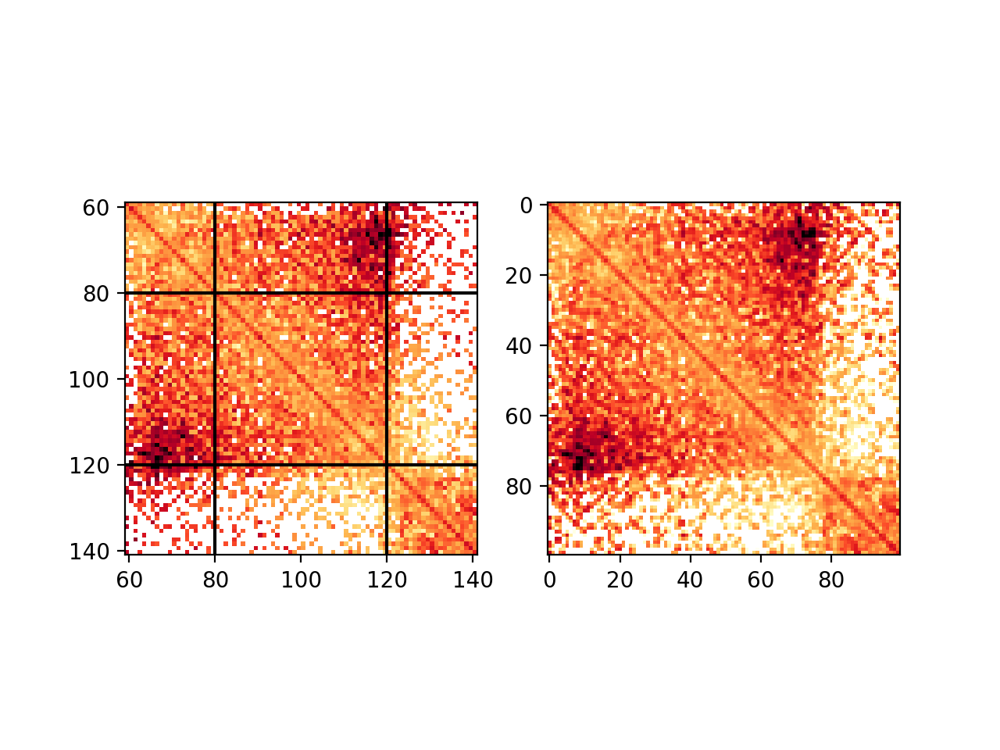

/home/sameer/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':


-1.5294560387473985 12.8139709219281


/home/sameer/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in log10


In [5]:
fig, ax = plt.subplots(ncols=2)
ind = np.random.choice(tads.index.values)
l = tads.loc[ind].copy()
l['pos'] = (l['start1'] + l['end1'])//2
size = l['size']//10000
st = (l['pos'] - l['start1'])//10000
end = (l['end1'] - l['pos'])//10000
p = pu[100-size:100+size,100-size:100+size,ind]
ax[0].imshow(np.log10(p), cmap='fall', extent=[100-size,100+size,100+size,100-size], vmin=-1, vmax=1)
ax[0].axhline(100-st, color='k')
ax[0].axhline(100+end, color='k')
ax[0].axvline(100-st, color='k')
ax[0].axvline(100+end, color='k')
p[~np.isfinite(p)] = 0
zp = zoomArray(p, (100,100), sameSum=False)
print(zp.min(), zp.max())
ax[1].imshow(np.log10(zp), cmap='fall', vmin=-1, vmax=1)

In [8]:
p.shape

(82, 82)

<IPython.core.display.Javascript object>


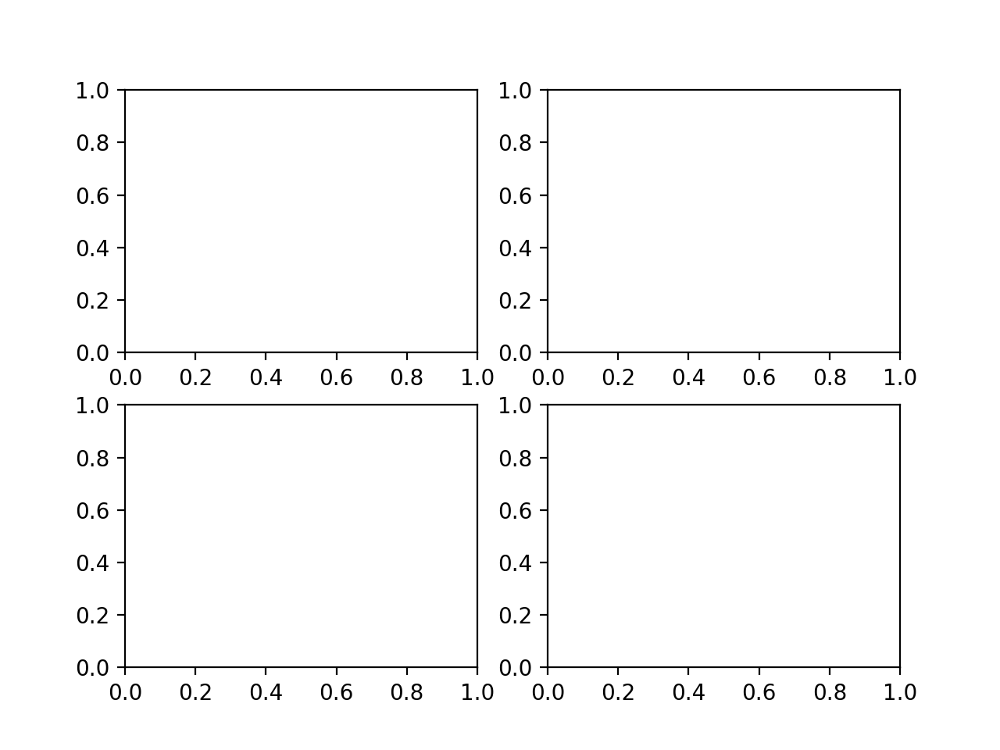

IndexError: tuple index out of range

In [6]:
fig, ax = plt.subplots(nrows=2, ncols=2)
new_p = np.log10(np.mean(p, axis=2))
print(new_p.min(), p.max())
lim=0.3
ax[0,0].imshow(new_p, cmap='coolwarm', vmin=-lim, vmax=lim)
mid = new_p[25:75,25:75]
mask = np.arange(len(mid))
mask = (np.abs(mask[None,:]- mask[:,None]) < 12) | (np.abs(mask[None,:]- mask[:,None]) > 40)
mid[mask] = 0
mid = np.triu(mid)
print(mid[mid!=0].flatten().shape)
ax[0,1].imshow(mid, cmap='coolwarm', vmin=-lim, vmax=lim)

top = new_p[40:75, 80:]
print(top.flatten().shape)
ax[1,0].imshow(top, cmap='coolwarm', vmin=-lim, vmax=lim)

bot = new_p[0:20,25:60]
print(bot.flatten().shape)
ax[1,1].imshow(bot, cmap='coolwarm', vmin=-lim, vmax=lim)

In [ ]:
def tad_metric_rao(pileup):
    assert pileup.shape[0] == 100
    assert pileup.shape[1] == 100
    
    mid = pileup[25:75,25:75]
    mask = np.arange(len(mid))
    mask = (np.abs(mask[None,:]- mask[:,None]) < 12) | (np.abs(mask[None,:]- mask[:,None]) > 40)
    mid[mask] = 0
    mid = np.triu(mid)
    mid = np.nanmean(mid[mid!=0].flatten())
    
    top = pileup[40:75, 80:].flatten()
    bot = pileup[0:20,25:60].flatten()
    out = np.nanmean(top+bot)/2
    
    return mid/out

In [12]:
db = mm.Dataset()
table = db.get_tables()
table = mm.filter_data(table, filter_dict={'celltype':'HFF','enzyme':'MNase'})
table = mm.get_tads(table,  'rao2014', 10000)
table

,lib_name,seq,celltype,xlink,enzyme,cycle,tads_10000
0,U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38,control,HFF,DSG,MNase,NS,<matrix_manager.Pileup object at 0x7f82ac3e4630>
1,U54-HFFc6-FA-DSG-MNase-R1-R3_hg38,deep,HFF,DSG,MNase,NS,<matrix_manager.Pileup object at 0x7f82ac3e4e10>
2,U54-HFF-plate-EGS-MNase-20190509-R2-T1__hg38,-,HFF,EGS,MNase,NS,<matrix_manager.Pileup object at 0x7f82ac37c048>
3,U54-HFF-plate-FA-MNase-20190509-R2-T1__hg38,-,HFF,FA,MNase,NS,<matrix_manager.Pileup object at 0x7f82ac37c908>


In [15]:
tad_scores=[]
for i, row in table.iterrows():
    print(row['lib_name'])
    snips = row['tads_10000'].load()
    new_snips = np.empty((100,100,len(tads)))
    
    for i, entry in tads.iterrows():
        start = entry['start1']
        end = entry['end1']
        size = (end-start)//10000
        s = snips[100-size:100+size,100-size:100+size,i]
        s[~np.isfinite(s)] = 0
        s = zoomArray(s, (100,100))
        new_snips[:,:,i] = s
    
    pileup = np.log10(np.nanmean(new_snips, axis=2))
    break

U54-HFF-plate-DSG-MNase-20190509-R2-T1__hg38


-0.25052342332564587 0.5015615269133215


<IPython.core.display.Javascript object>


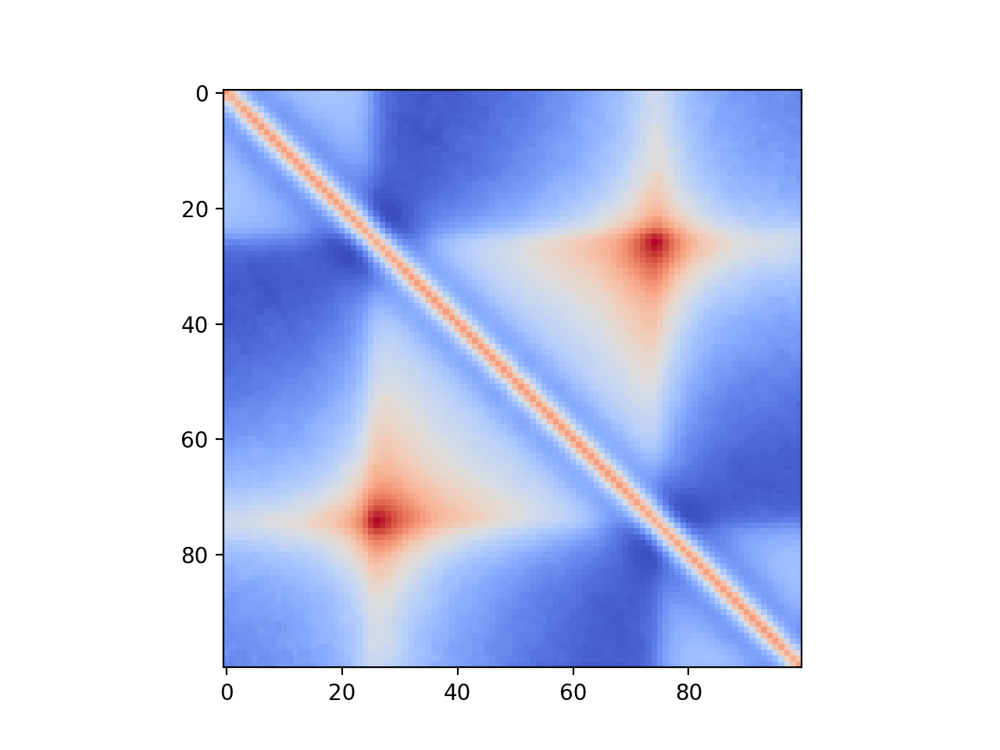

In [17]:
print(np.nanmin(pileup), np.nanmax(pileup))
plt.figure()
plt.imshow(pileup, cmap='coolwarm')

In [ ]:
db.modify_table('tads', table[['lib_name','tad_strength']])

In [ ]:
imp.reload(mm)
db = mm.Dataset()
table = db.get_tables(db.keys)
table

In [ ]:
categories = ['celltype', 'enzyme', 'xlink']
quant = 'cis_score'

fig, ax = plt.subplots(ncols=len(categories), figsize=(10,3))

df = mm.filter_data(table, filter_dict={'celltype':'HFF','type':['-','control'], 
                                         'cycle':['NS']})

for i in range(len(categories)):
    cat = categories[i]
    colors = get_custom_cmap(len(df[cat].unique()))
    if not i:
        ax[i].set_ylabel(quant)
    j = 0
    for ct, group in df.groupby(cat):
        x = group['avg_slope'].values#[ind]
        y = group[quant].values#[ind]
        ax[i].set_title(cat)
        ax[i].scatter(x, y, color=colors[j], label=ct)
    #     ax.set_xlim([0.75*np.min(x), 1.25*np.max(x)])
        j+=1

    ax[i].legend()

In [ ]:
# pu = np.log10(np.nanmean(pileup, axis=2))
# print(pu.max(), pu.min())
# plt.figure()
# plt.imshow(pu, vmax=0.1, vmin=-0.1, cmap='coolwarm',
#           extent=[-40*10, +40*10, -40*10, +40*10])
# plt.savefig('/home/sameer/Dropbox (MIT)/Research/dekker/TADs/example_TAD.png', format='png')

In [ ]:
def tad_metric1(pileup):
    
    mid = pileup[0:41,40:]
    mid = np.tril(mid)
    mid[mid==0] = np.nan
    mid[-3:,:] = np.nan
    mid[:,0:4] = np.nan
    diag = np.arange(mid.shape[0])
    diag = diag[None, :] - diag[:, None]
    diag = diag > -20
    mid[diag] = np.nan
    out_score = np.nanmean(mid)
    
    top = pileup[40:,40:]
    top = np.triu(top)
    top[top==0] = np.nan
    top[0:10,:] = np.nan
    diag = np.arange(top.shape[0])
    diag = diag[None, :] - diag[:, None]
    diag = diag < 18
    top[diag] = np.nan
    
    bot = pileup[0:41,0:41]
    bot = np.triu(bot)
    bot[bot==0] = np.nan
    bot[:, -10:] = np.nan
    diag = np.arange(bot.shape[0])
    diag = diag[None, :] - diag[:, None]
    diag = diag < 18
    bot[diag] = np.nan
    
#     fig, ax = plt.subplots(ncols=3, figsize=(9,3))
#     ax[0].set_title('Middle')
#     ax[0].imshow(np.log10(mid), vmax=0.1, vmin=-0.1, cmap='coolwarm')
#     ax[1].set_title('Bottom')
#     ax[1].imshow(np.log10(top), vmax=0.1, vmin=-0.1, cmap='coolwarm')
#     ax[2].set_title('Top')
#     ax[2].imshow(np.log10(bot), vmax=0.1, vmin=-0.1, cmap='coolwarm')
#     fig.savefig('/home/sameer/Dropbox (MIT)/Research/dekker/TADs/example_slice1.png', format='png')
    
    in_score = (np.nansum(top) + np.nansum(bot))/(np.sum(~np.isnan(top)) + np.sum(~np.isnan(bot)))
#     print(in_score, out_score)
    return in_score/out_score

def tad_metric2(pileup):
    mid = pileup[0:41,40:]
    mid = np.tril(mid)
    mid[mid==0] = np.nan
    mid[-3:,:] = np.nan
    mid[:,0:4] = np.nan
    diag = np.arange(mid.shape[0])
    diag = diag[None, :] - diag[:, None]
    diag = diag > -20
    mid[diag] = np.nan
    out_score = np.nanmean(mid)
    
    top = pileup[40:,40:]
    top = np.triu(top)
    top[top==0] = np.nan
    top[:, -5:] = np.nan
    diag = np.arange(top.shape[0])
    diag = diag[None, :] - diag[:, None]
    diag = diag < 22
    top[diag] = np.nan
    
    bot = pileup[0:41,0:41]
    bot = np.triu(bot)
    bot[bot==0] = np.nan
    bot[0:5,:] = np.nan
    diag = np.arange(bot.shape[0])
    diag = diag[None, :] - diag[:, None]
    diag = diag < 22
    bot[diag] = np.nan
    
#     fig, ax = plt.subplots(ncols=3, figsize=(9,3))
#     ax[0].set_title('Middle')
#     ax[0].imshow(np.log10(mid), vmax=0.1, vmin=-0.1, cmap='coolwarm')
#     ax[1].set_title('Bottom')
#     ax[1].imshow(np.log10(top), vmax=0.1, vmin=-0.1, cmap='coolwarm')
#     ax[2].set_title('Top')
#     ax[2].imshow(np.log10(bot), vmax=0.1, vmin=-0.1, cmap='coolwarm')
#     fig.savefig('/home/sameer/Dropbox (MIT)/Research/dekker/TADs/example_slice2.png', format='png')
    
    in_score = (np.nansum(top) + np.nansum(bot))/(np.sum(~np.isnan(top)) + np.sum(~np.isnan(bot)))
#     print(in_score, out_score)
    return in_score/out_score

In [ ]:
pu = np.nanmean(pileup, axis=2)

fig, ax = plt.subplots(ncols=3, figsize=(9,3))
ax[0].set_title('Middle')
ax[0].imshow(np.log10(pu[0:41,40:]), vmax=0.1, vmin=-0.1, cmap='coolwarm',
            extent= [0, 400, 0, -400])
ax[1].set_title('Bottom')
ax[1].imshow(np.log10(pu[40:,40:]), vmax=0.1, vmin=-0.1, cmap='coolwarm',
            extent= [0, 400, 0, 400])
ax[2].set_title('Top')
ax[2].imshow(np.log10(pu[0:41,0:41]), vmax=0.1, vmin=-0.1, cmap='coolwarm',
            extent= [-400, 0, 0, -400])

# fig.savefig('/home/sameer/Dropbox (MIT)/Research/dekker/TADs/example_TAD2.png', format='png')

In [ ]:
score1 = tad_metric1(pu.copy())
score2 = tad_metric2(pu.copy())

In [ ]:
data = mm.Dataset()
table = data.get_tables()

In [ ]:
scores = {}
for ins_list in list_names:
    print(ins_list, '\n')
    scores[(ins_list, 'score1')] = []
    scores[(ins_list, 'score2')] = []
    
    tads = mm.get_tads(table, 10000, ins_list)
    
    for _, row in tads.iterrows():
        pileup = row['tads_10000'].load()
        if np.all(np.isnan(pileup)):
            scores[(ins_list, 'score1')].append(np.nan)
            scores[(ins_list, 'score2')].append(np.nan)
            continue
        print(row['lib_name'])
        pileup = np.nanmean(pileup, axis=2)
        
        score1 = tad_metric1(pileup.copy())
        score2 = tad_metric2(pileup.copy())
        print(score1, score2)
        
        scores[(ins_list, 'score1')].append(score1)
        scores[(ins_list, 'score2')].append(score2)
        
        

In [ ]:
# scores = {(outerKey, innerKey): values for outerKey, innerDict in scores.items() for innerKey, values in innerDict.items()}
scores = pd.DataFrame(scores)
scores['lib_name'] = tads['lib_name']

In [ ]:
scores.columns

In [ ]:
table = data.get_tables('trans_lvl')
table

In [ ]:
scores.columns.get_level_values(level=0)

In [ ]:
colors = ['b','r','g','k']
category = 'xlink'
for ll in scores.columns.get_level_values(level=0).unique():
    print(ll)
    if ll == 'lib_name':
        continue
    sc = scores[['lib_name', ll]].dropna()
    meta = sc.merge(table, on='lib_name', how='left')[['lib_name', 
                                                       'xlink', 'enzyme' ,'type', 'trans_100000']]
#     print(sc)
    fig, ax = plt.subplots()
    ax.set_xlim([-5*10**-6, 3*10**-5])
#     ax[1].set_xlim([-5*10**-6, 3*10**-5])
    fig.suptitle(ll)
    
    cat_list = list(meta[category].unique())
    
    for i, cat in enumerate(meta[category].unique()):
        mask = (meta[category] == cat).values

        x = meta.loc[mask, 'trans_100000'].values
        y1 = sc.loc[mask, (ll, 'score2')].values
#         y2 = sc.loc[mask, (ll, 'score2')].values
        if cat in cat_list: 
            ax.scatter(x, y1, color=colors[i], label=cat)
            cat_list.remove(cat)
        else:
            ax.scatter(x, y1, color=colors[i])
#         ax[1].scatter(x, y2, color=colors[i])
    ax.legend()
#     fig.savefig('/net/wiz/home/sameer')